In [1]:
#!pip install geopandas
#!pip install folium

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd

from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV


from sklearn.svm import SVR

from sklearn.neural_network import MLPRegressor

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from scipy.stats import randint

from sklearn.tree import DecisionTreeRegressor
from sklearn import tree

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor

import matplotlib.pyplot as plt

from folium.plugins import HeatMap
import folium

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [3]:
""" Plots heatmap of a variable (e.g prediction error) given GeoDataFrame."""
def heatmap(df, var):
    df['lon'] = df.geometry.centroid.x
    df['lat'] = df.geometry.centroid.y
    
    df = df[['lat','lon',var]]
    df = df[df[var] != 'None']
    df = df[df[var] != 'none']
    df = df.dropna()

    
    hm = folium.Map(location=[37.8272, -122.2913], tiles='cartodbpositron', zoom_start=11)
    HeatMap(df, 
        min_opacity=0.2,
        blur = 15
               ).add_to(folium.FeatureGroup(name='Heat Map').add_to(hm))
    folium.LayerControl().add_to(hm)
    return hm

# Predicting Block-Level Median $NO_2$ Concentration from Geospatial Embeddings

## Abstract

Using Google Street View Car (GSW) data of the Bay Area and Sentinel-1 & 2 derived geospatial embeddings, this project illustrates the potential for hyper-local pollutant prediction monitoring. With a future goal of developing a robust framework for multi-pollutant predictions, we explore its applicability for block-level median $NO_2$ concentrations.


Through an explorative pre-processing of the GSW- and embeddings data and experimentation with a series of geospatial joins, we construct a normalized dataset used in model training, testing, and deployment on validation. 

While training a series of hyper-parameter tuned individual models, this project takes also advantage of the development of 'stacking'. Our final model trains on the predictions optimal pre-tuned models, resulting in a MSE on the validation set of 5.66, agreeably lower than most individual models.

Although with much room for future improvement before reaching a robust and generalizable framework, this project has demonstrated that models trained on geospatial embeddings has the potential to predict block-level mean $NO_2$ concentrations on unseen data to a relatively significant degree.



## Project Background

#### Background on $NO_2$ and Geospatial Embeddings
$NO_2$ is a pollutant that is released from any fossil fuel combustion process.

In industrial societies, most of our machinery is run off of fossil fuels from our vehicles, to factories, to farm equipment. 

While there are many benefits from using the fossil fuel combustion process, there are several negative externalities such as build up of particulate matter and ozone – both of which can cause respiratory diseases.

Because of this, it is important that we monitor pollutants such as $NO_2$ to ensure that they remain below the chronic threshold for the development of respiratory diseases. But one of the difficulties with monitoring NO2 levels is having a spatially granular enough monitoring system.

Monitoring devices for NO2 are around $400 per unit so air quality scientists must be very selective with where these devices are optimally located.

But even when well optimized, there might still be locations where measurements are desirable but public agencies simply do not have the funds to place monitors everywhere throughout their territory.

One way to make up for this deficiency is to build a model that predicts the $NO_2$ concentrations in regions without monitors based on geospatial characteristics. Using satellite data on land characteristics, we built a model to predict the $NO_2$ concentrations of regions that do not have $NO_2$ monitoring systems.

To our knowledge, this specific application of geospatial embeddings has never been done before.

## Project Objective

#### Specified Project Objective
The purpose of this project is to predict block-level mean $NO_2$ concentrations (measured in ppb) using a unique dataset of 390 geospatial embedding features.

## Input Data Description

### Google Street View Car Multi-Pollutant Dataset

The first data set contains the NO2 concentration levels throughout the Bay Area that map to coordinates. This data is sourced from Google Street View cars and it is collected on the scale of census blocks.

The cars collected the NO2 measurements by attaching NO2 sensors (Aclima mobile platform) to the cars as they drove around different cities in the Bay Area which means that the data wasn’t measured with consistent temporality but rather averaged over the number of measurements the cars took throughout a 32 month period whenever they passed through a census block.

The data provides estimates of the outdoor air quality from May 2015 through December 2017. The NO2 is measured in parts-per-billion (ppb). 

The dataset can be accessed [here.](https://figshare.com/articles/dataset/Bay_Area_Mobile_Monitoring_Multi-pollutant_Block_Medians/15070314)

### EarthRise Geospatial Embeddings

Important note: We kindly ask that the data-generation process described below is not shared with anyone.

Our second data set contains data on satellite imagery and analysis of 100m x 100m plots of land which is to be used as the features for our prediction models. 

Each 100m x 100m block is split up into 32 x 32 pixels. Then for each pixel, there are 12 “bands” of measurements, such a UV intensity or vegetation index. The data for each of these bands is sourced from the European satellites Sentinel-1 and Sentinel-2.

The band names are B11, B12, B2, B3, B4, B5, B6, B7, B8, B8A, NDVI, and NDWI and their meanings can be referenced [here.](https://gisgeography.com/sentinel-2-bands-combinations/)

Data is collected on each of these bands for each pixel $n$ times over a time period $t$.

The next step that our data source took was to compress the data across time and space. The $n$ measurements for each band over time period $t$ were put into a range and the 0th, 2nd, 50th, 75th, 98th, and 100th percentile of the data was selected. 

Then, for each of these percentiles of the total range in a given location, “sub-percentiles” of the 1st, 50th, and 99th within each percentile range were calculated. 

To understand how we can think about this, please consider the B11 band’s 0th percentile temporal reduction. 

The 100th percentile spatial reduction would then answer the question “What is the value of the *brightest* pixel of the data in a 32x32 pixel patch if we create a composite of the *darkest* values throughout the year?” 

Below we have also drawn up a visualization for how the data for each plot and pixel is calculated. 

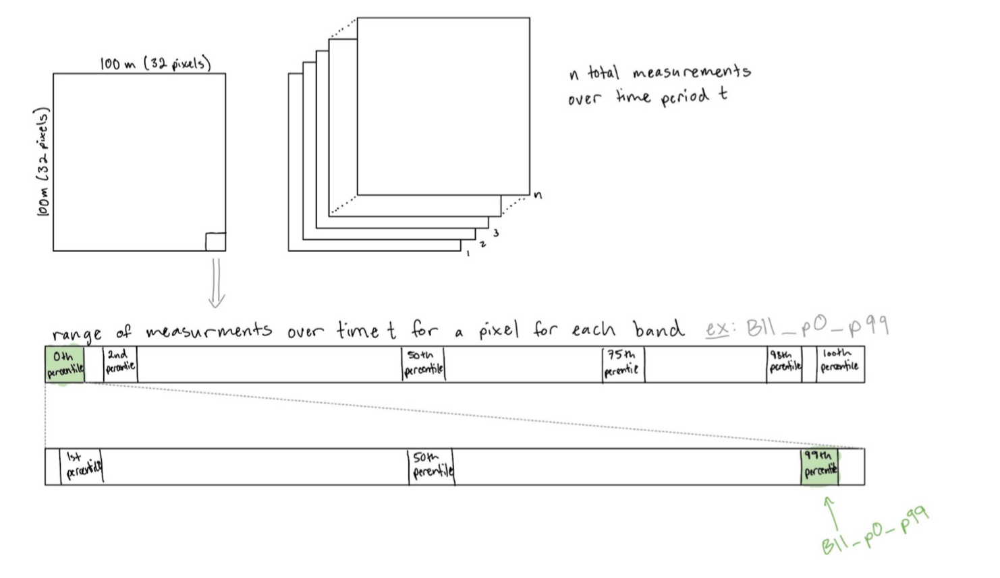

## Data Cleaning
This has by far been the most substantial portion of the project in terms of challenge and time spent. It resulted in the following file structure which can be found in the final project folder (/notebooks).  

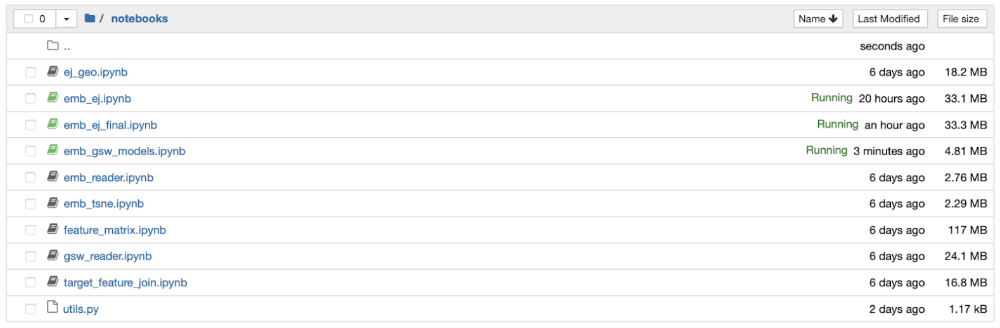

Relevant for the data cleaning process are:

**emb_reader.ipynb**
- Data Cleaning: Raw Embeddings Processing
- Loads in:  '10SEG_32610_32_16_10_110000.json', '10SEG_32610_32_16_10_130000.json', '10SEG_32610_32_16_10_120000.json', '10SEG_32610_32_16_10_140000.json', representing our area of interest in the Bay: San Francisco, Oakland, and Berkeley. We have 17 files representing all 9 counties in the Bay Area, amounting to approx. 5GB of raw data.
- Concatenates the 4 files into a single dataframe, and converts it into the GeoDataFrame ‘embeddings.shp’. The size of this shapefile is approx. 250 mb.
- This file is saved and later normalized and cleaned in feature_matrix.ipynb.

**gsw_reader.ipynb**
- Data Cleaning: GeoSpatial Target Variable Engineering Notebook
- Loads in ‘CA_block_2010.shp’, the geospatial block boundaries defined by the US Census.
- Loads in ‘bay_area_gsw_car.csv’, the Google Street View Car local air pollutant data.
- To give our target variable (hyper-local avg. NO2 concentration) a geospatial feature, we perform a merge on the GISJOIN feature shared across both aforementioned datasets. The result is a GSW GeoDataFrame with a geometry column. 
- We save this as gsw_geo.shp, later used in target_feature_join.ipynb
- This part was surprisingly challenging (took around 10 hrs of work), but much was resolved through the help of Prof. J.Apte’s team of researchers and several mapping functions we constructed in the process.

**feature_matrix.ipynb**
- Data Cleaning Normalization & Cleaning of Embeddings Feature Matrix
- Loads in pre-processed ‘embeddings.shp’ from emb_reader.ipynb, cleans and selects relevant columns,  and performs normalization using StandardScaler(). As our features have a wide range of units of measurement, this step is highly important in future model building.
- Returns final feature GeoDataFrame emb_norm.shp used in target_feature_join.ipynb

**target_feature_join.ipynb**
- Data Cleaning & EDA: Joining Target and Features.
- Loads in cleaned and normalized features from emb_norm.shp (from feature_matrix.ipynb).
- Loads in target variable dataset with geospatial component from gsw_geo.shp (from gsw_reader.ipynb)
- Ensures both use the same Coordinate Reference System (EPSG:4326) and ellipsoidal lat and lon coordinates.
- Performs brief target variable EDA (plots nans across 4 potential targets: NO, NO2, BC, and UFPs).
- After deciding on using NO2 as target variable, it performs a geospatial left join on the feature matrix using the ‘intersect’ predicate. 
- We experiment with ​​Intersects, Contains, Within, Touches, Crosses and the Overlaps predicates.
- We also explore several Overlay() options (intersection, union, symmetrical difference, and difference), but find that the chosen one retains the largest amount of target variable observations. (See notebook for details.)
- We observe that each block (target variable polygon) on average intersects with 6 100x100m / 32x32 pixel tiles. (We have 6431 unique observations of our target variable).
- To account for this and simplify model training and prediction, we perform a group by on the target variable polygon, using an unweighted average of the features. In future iterations of such a project, we would like to further explore weighted averages based upon area intersected.
- Returns ‘gsw_emb_unweighted.shp’, our final target + feature GeoDataFrame used for model training and prediction in the last notebook, ‘emb_gsw_models’.



## Data Summary and Exploratory Data Analysis

This first section of this chapter (up until t-SNE) can be thought of as 'soft' intro to EDA, as several parts of our *data cleaning* process was closely intertwined with exploring and finding creative ways to summarize our vast amounts of data.

#### Original Geographical Coverage

First we looked at the cities that the Google Street Car data set contained.
The cities included downtown Oakland, West Oakland, East Oakland, San Francisco Richmond District, San Francisco Financial District, San Francisco Sunset District, Berkeley, Fruitvale Group, Richmond, Redwood City, Palo Alto, Livermore, Sebastopol, and Millbrae. 


#### New Geographical Coverage
We then wanted to parse down the data set to San Francisco and East Bay so we decided to only include the data from downtown Oakland, West Oakland, East Oakland, San Francisco Richmond District, San Francisco Financial District, San Francisco Sunset District, Berkeley, and Fruitvale Group. Below is a visualization of the data that we included (circled in green) and the data we parsed out (crossed out in red).


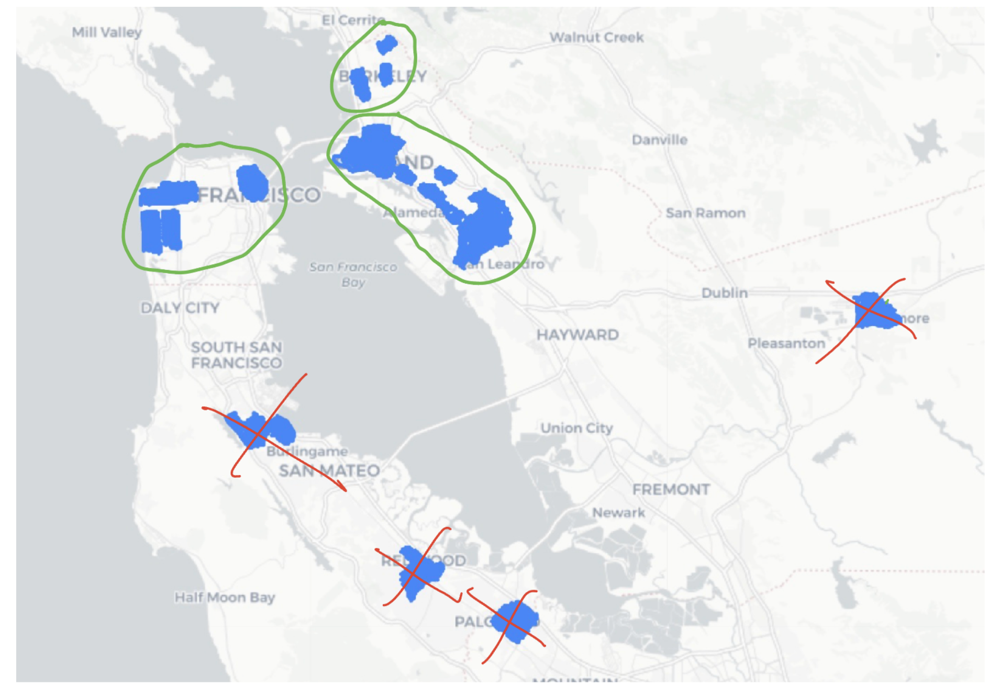

#### Reducing and Summarizing the Geospatial Embeddings

We then looked at the satellite land data and parsed it down to sections of the data that only covered the cities we included in the Google Street Car Data. 

The purpose of this was to minimize the number of comparisons, therefore the computation cost, that we would need to perform to see which satellite blocks overlapped with the census blocks from the street car data.

The satellite data files we had were broken up into sections of 10,000 blocks with each block being 100 meters x 100 meters. 

We observed the land coverage for each file of 10,000 blocks to see which ones overlapped with the census block data (visualization shown below). We then figured out that we needed four of the files of the satellite data to fully cover our selected cities from the street car data. There were 17 such files in total, covering the whole Bay Area.


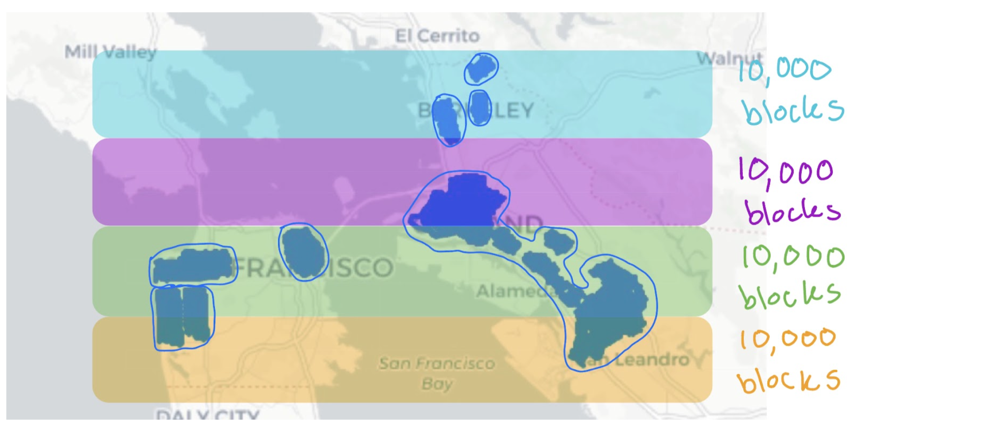

#### Exploring 1st Way to Combine GSW and Geospatial Embeddings

We then needed to decide (conceptually) how we were going to match the feature satellite data with the census block data. 

Our initial idea was to use the overlay function from pandas to find the percent overlap of each satellite block with each census block. 

We would then *weight* the feature values from each satellite block with its percent overlap with the census block and average the feature values over all satellite blocks that overlap with the census block (example shown below).

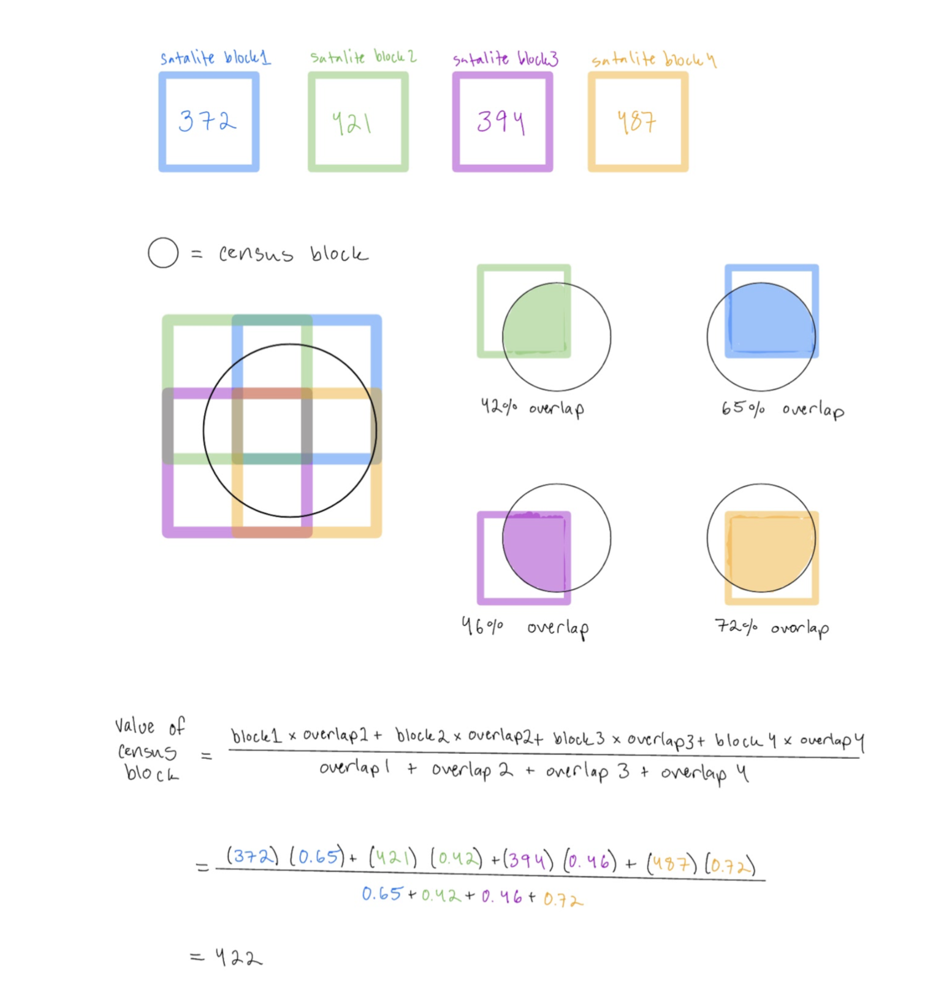

#### Exploring a 2nd Combination Method

This method would be a very granular method to find the percent overlay, but when we tried to implement this method, we ran into issues finding the areas of the regions of overlap so we decided to simply average the values of the satellite blocks that overlapped with the census blocks *without the weighting factor* (example shown below). While this method is less precise, we believe it can still give us relatively decent estimates of the true feature values of each census block. In future iterations of this project, it would be worth exploring the first idea.

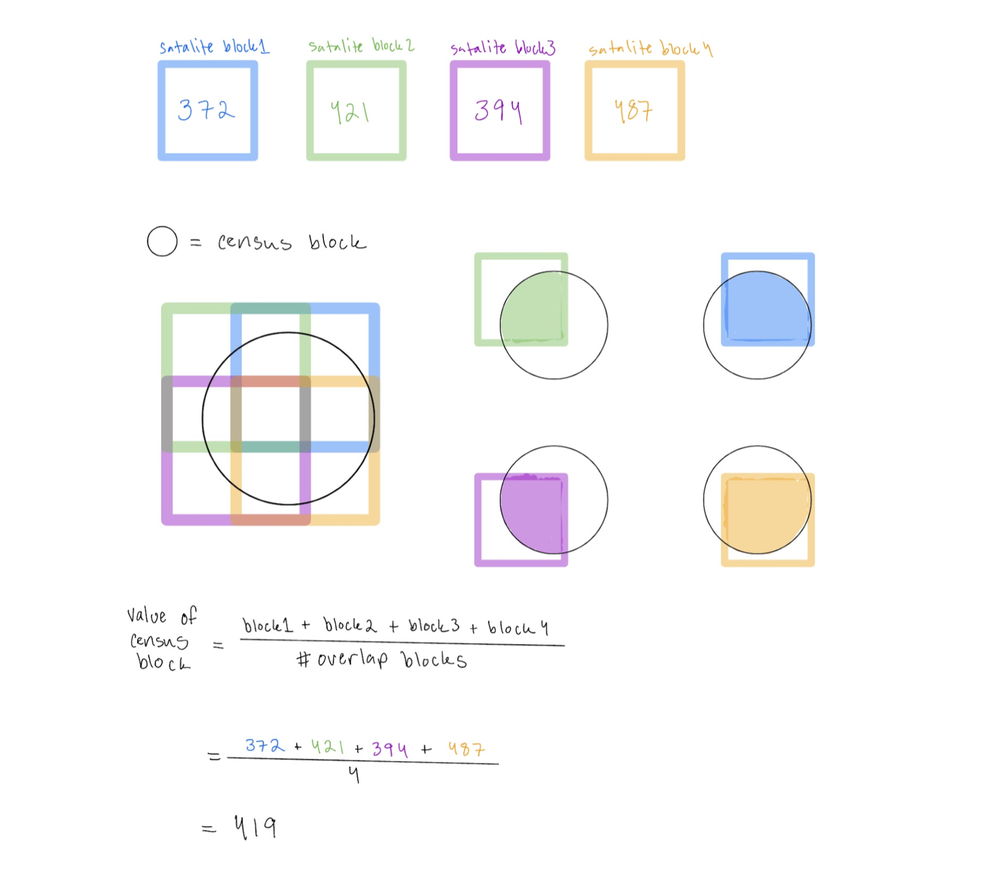

### t-SNE: Going from $R_{390}$ to $R_2$

Before unleashing the full power of our embeddings, we inquired about potentially relevant structures not evident in the high-dimensional space. Instead of generating a series of correlation plots (or matrices) or regress subsets of our features on our target variable - we decided to take a more 'holistic' approach. With a goal of using the full extent of our features, we asked instead if a series of inherent, yet 'hidden' structures could be explored through dimensionality reduction. For this task, we applied the t-distributed stochastic neighbor embedding algorithm. 

Please refer to this [article](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding) for a description of the t-SNE algorithm.

The code for this can be found in the `emb_tnse.ipyn` notebook. It takes about 4 hours to run, but the output can be found below.

#### t-SNE of San Francisco and Oakland

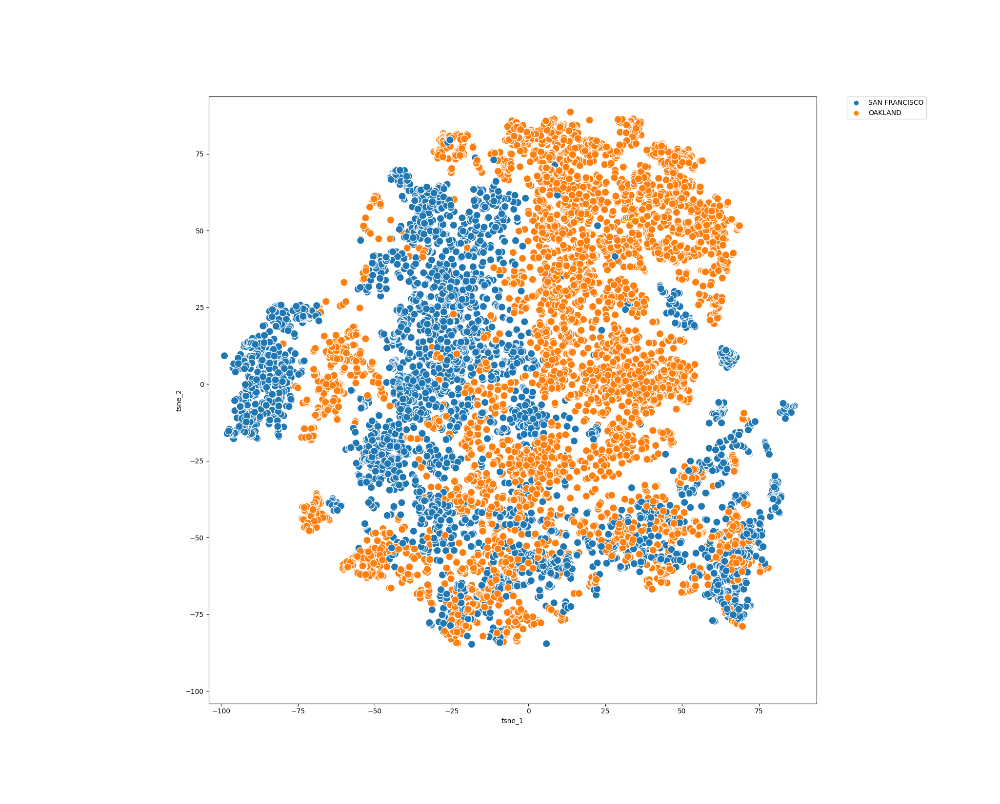

The main takeaway from running it on our geospatial embeddings marked as either belonging to San Francisco or Oakland is that it appears to contain a *separable structure*. That is, *without* telling telling the algorithm where each embedding is located, it was able to figure it out (pretty well) by itself! This can be shown from the clusters formed and what appears to be a potential point of vertical separation in the middle.

#### t-SNE of the Bay

This is less evident when applied to a larger sample of places in the Bay. It is still pretty impressive how locations are geograpically clustered based solely on the geospatial embeddings. This gives room for thinking about the potential of embeddings for location-based classification - but that's another project!

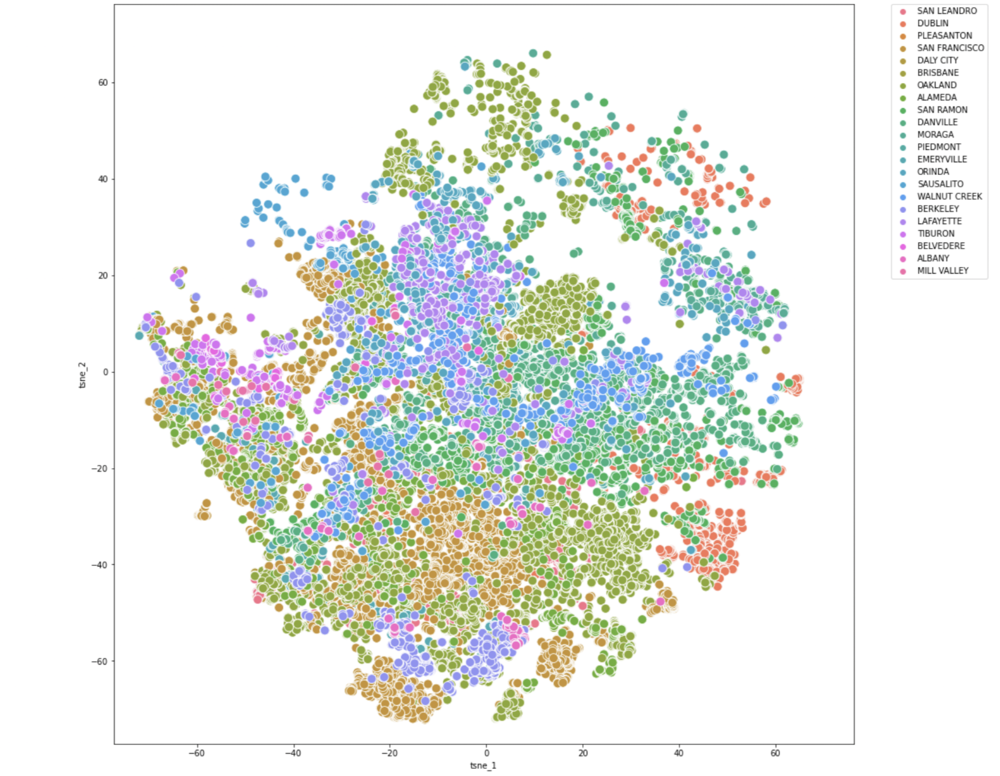

### Heatmap of block-level $log$ $NO_2$ concentrations

This section concern itself with visualizing our the $log$ $NO_2$ concentrations of our area of interest. Why logged? Plotting the raw $NO_2$ values themselves simply did not yield a meaningful plot. By logging, we're able to better see areas with higher (and lower) $NO_2$ levels. As a sanity check, do have a second look at highways and busy intersections. 

In [4]:
df = gpd.read_file('data/gsw_emb_unweighted.shp').drop('index',axis=1)
y = df[['NO2', 'geometry']]
y['logNO2'] = np.log(df['NO2'])
heatmap(y,'logNO2')

## Forecasting and Prediction Modeling: The Unweighted GeoSpatial Join

In this section, we perform our prediction modeling part of the project. As a primer, we repeat our prediction task at hand: 

We seek to predict block-level median $NO_2$ concentrations (measured in ppb) using a 390 geospatial embedding features. We have 4137 unique values of our target variable.

As aid to the reader, we aim to carefully walk through the modelling process, starting with a simple linear regression model and ending in a stacked ensemble of 5 hyperparameter-tuned linear and non-linear models.

### Load in $NO_2$ normalized geospatial embeddings dataset

This file was pre-processed in the `target_feature_join.ipynb` notebook.

In [5]:
df = gpd.read_file('data/gsw_emb_unweighted.shp').drop('index',axis=1)

### Save `index` and `geometry` columns for prediction error heatmapping

In [6]:
df_geo = df.copy(deep=True)

We run a quick `describe()` call. Throughout the modeling process, we find it helpful to reference the summary statistics of our target variable for a consideration of the magnitude of the different MSEs.

In [7]:
df_geo.describe()

,NO2,index_righ,B11_kurtos,B11_kurt_1,B11_kurt_2,B11_p0_p1,B11_p0_p50,B11_p0_p99,B11_p100_p,B11_p100_1,...,VV-VH-RA20,VV-VH-RA21,VV-VH-RA22,VV-VH-RA23,VV-VH-RA24,VV-VH-RA25,VV-VH-RA26,VV-VH-RA27,VV-VH-RA28,VV-VH-RA29
count,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,...,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000
mean,10.722610,19649.908725,-0.217193,-0.296645,-0.197290,0.391038,0.107171,0.155471,0.120567,-0.146826,...,0.617980,-0.292755,0.305455,0.555897,-0.617052,0.196176,0.363013,-0.720304,0.329841,0.737340
std,4.990190,8488.639224,0.671732,0.442325,0.581178,0.738254,0.605090,0.856687,0.423120,0.236005,...,1.074634,1.291622,1.375436,1.162655,1.030446,1.499154,0.873587,1.064202,1.498928,1.213993
min,1.473833,3438.125000,-1.316687,-0.726767,-0.945891,-1.243934,-1.464966,-1.889908,-2.097559,-1.246306,...,-1.122165,-3.403362,-2.060310,-1.289008,-4.201525,-2.472712,-1.312217,-3.579057,-1.187204,-0.819618
25%,7.551967,12298.666667,-0.682379,-0.577418,-0.650081,-0.172308,-0.312754,-0.363079,-0.046898,-0.296274,...,-0.117182,-1.285088,-0.770513,-0.254249,-1.084023,-0.685132,-0.354377,-1.248876,-0.530288,-0.114565
50%,10.191000,21080.000000,-0.415790,-0.477897,-0.331227,0.456730,0.254803,0.254509,0.194537,-0.176965,...,0.277590,-0.371375,0.130814,0.138629,-0.531986,-0.300416,0.267512,-0.731870,-0.276253,0.256139
75%,13.517000,26228.500000,0.060290,-0.195922,0.088216,0.942197,0.509805,0.646527,0.372658,0.015290,...,1.120181,0.635170,0.844214,1.102964,-0.041129,0.502989,0.983679,-0.280047,0.536508,1.171308
max,41.908668,39958.000000,3.848766,2.824677,2.996063,2.246163,1.506679,3.575206,1.082089,1.100689,...,4.050601,4.262594,4.714953,4.948736,3.417911,5.726010,4.529703,4.551048,6.845530,4.819476


### Split target variable and feature matrix

We save $y$ as a $1 \times n$ vector and $X$, our feature matrix, as a $ 390 \times n$ matrix. Here, $n$ is the number of unique observations.

In [8]:
X = df.drop(['NO2', 'index_righ', 'geometry'], axis=1)
y = df["NO2"]
X.head()

,B11_kurtos,B11_kurt_1,B11_kurt_2,B11_p0_p1,B11_p0_p50,B11_p0_p99,B11_p100_p,B11_p100_1,B11_p100_2,B11_p25_p1,...,VV-VH-RA20,VV-VH-RA21,VV-VH-RA22,VV-VH-RA23,VV-VH-RA24,VV-VH-RA25,VV-VH-RA26,VV-VH-RA27,VV-VH-RA28,VV-VH-RA29
0,-0.664036,-0.452253,-0.198192,0.252662,0.217666,0.291254,0.137118,-0.211222,-0.421506,0.020122,...,1.757993,1.140913,1.859309,2.908355,0.375852,1.472357,1.530188,0.408179,1.242794,2.462494
1,-0.622019,-0.501857,-0.128645,0.499946,0.268808,0.298071,-0.034641,-0.339336,-0.369776,0.185201,...,1.697625,1.190848,1.787426,2.661565,0.581650,1.373351,1.375606,0.333975,0.991961,2.205185
2,-0.668684,-0.397769,-0.002926,0.040376,0.205195,0.355585,0.176738,-0.101855,-0.387605,-0.112826,...,1.527939,1.031838,1.641495,2.882014,0.300492,1.475422,1.523810,0.317431,0.983423,2.419720
3,-0.743563,-0.482110,-0.261230,-0.489528,0.253625,0.799309,0.319688,0.024262,-0.122756,-0.567913,...,1.135940,0.120531,0.554808,1.501979,-1.283515,-0.811534,1.074293,-1.285282,0.193511,1.421445
4,-0.731328,-0.444536,-0.208511,-0.380514,0.237681,0.618466,0.366583,0.038340,-0.228310,-0.461854,...,1.412299,0.465126,1.074281,1.999020,-0.724882,-0.039444,1.236336,-0.804458,0.674498,1.926642


### Splitting data into Validation, Testing, & Training sets

We proceed by splitting our $X$ and $y$ into training, testing, and validation sets. First, we save 10% (approx. 600 observations) for model validation. Out of the 90% remaining, we split 30% into testing data and 70% into training sets. As for justification, we refer to industry and research norm. 

We add that we opted to a slighly larger test set (70/30 instead of 80/20) with the goal of earlier identifying potential overfitting on training data (through observationable large differences in test/train MSE during modeling).

In [9]:
X, X_val, y, y_val = train_test_split(X, y, test_size=.10, random_state=2022)

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=2022)

In [11]:
print(X_train.shape, X_test.shape, X_val.shape)

(2606, 390) (1117, 390) (414, 390)


### Fit first model: LinearRegression

Time to build our first model! We fit a `Linear Regression` model on the full sample of features: no regularization - that's next or other forms of feature selection. 

The justification for this is the belief that our final and most successful model might take advantage of our full feature space, and we would like to keep a full linear model as train/test MSE reference.


In [12]:
model = LinearRegression()
model = model.fit(X_train, y_train)

After fitting the model, we predict on the test set and record test MSE. Later, we build a framework to run multiple model at the same time and observe the train MSE as well.

In [13]:
pred = model.predict(X_test)
mean_squared_error(y_test, pred)

7.691000042635963

We observe a relatively high test MSE (feel free to reference the `describe()` call above). Out of curiosity, we also inquire for the un-adjusted $R^2$ score, but find this less relevant as our models increase in complexity. From now on, we measure our model performance in train, test, and validation MSEs.

In [14]:
r2_score(y_test, pred)

0.6928178488658399

As a first comparison, we also print a subset of true and predicted target variable values. However, with the goal of identifying areas in which our model under- or over-predicts, we proceed with the `HeatMap` and `pred_err_plot()` functions below for future model comparison.

In [15]:
print(y_test)

271     12.868200
2842    12.519667
3788     4.435550
2651     7.648655
605      9.803329
          ...    
1834     9.588314
1347    12.995475
1097    17.020834
128     23.967900
3859     3.094650
Name: NO2, Length: 1117, dtype: float64


In [16]:
print(pred)

[11.59522241 10.99314328  3.21457858 ... 14.20977362 16.70855751
  3.88673102]


### Analysis Tool: Building a HeatMap of Prediction Errors

Given that each prediction has a geospatial component, we ask: how does the MSE vary across each region for this given model? In this context, we define region as the centroid of the target variable's geometry boundaries. 

Please remark that this function (used extensively through this notebook) does not plot *MSE*, but *prediction error*, as defined by the distance from the true predicted value. Why? We seek to identify not only locations' magnitude of error, but its *directionality*. 

Future iterations of this project would like to explore the effect on other measurements of error - any suggestions well received!

In [17]:
""" Given original df, target variable, train-test split, and any model, plots geospatial prediction error."""
def pred_err_plot(df, X_train,y_train, X_test, y_test, model, target = 'NO2'):
    # Select subset dfs
    df_train = df[df.index.isin(X_train.index)][[target, 'geometry']]
    df_test = df[df.index.isin(X_test.index)][[target, 'geometry']]
    
    
    model = model.fit(X_train, y_train)
    # Predict on subset
    train_pred, test_pred = model.predict(X_train), model.predict(X_test)
    
    # Save prediction
    col = 'pred_' + target
    df_train[col] = train_pred
    df_test[col] = test_pred
    
    # Calculate Prediction error
    #df_train['pred_err'] = df_train[target] - df_train[col]
    #df_test['pred_err'] = df_test[target] - df_test[col]
    
    # Calculate Prediction error percentage
    df_train['pred_err'] = (df_train[target] - df_train[col])/df_train[target]
    df_test['pred_err'] = (df_test[target] - df_test[col])/df_test[target]
    
    
    # Return 2 heatmaps, 1 for each train and test set
    #return df_test
    return [heatmap(df_train,'pred_err'),heatmap(df_test,'pred_err')]

In [18]:
train_map, test_map = pred_err_plot(df, X_train, y_train, X_test, y_test, model)

With the train and test maps for the Linear model generated, we can easily plot them by calling their variable names below. Note that this map is fully interactive!

In [19]:
train_map

In [20]:
test_map

## Ridge and Lasso Regressions

With the first model (`LinearRegression()`) built, we proceed to generalize the process of building, training, and deploying models. We also seek to find the optimal hyperparameters when needed, and analyse the geospatial prediction errors.

Our next set of models are `Ridge()` and `Lasso()` regressions, so-called regularizable linear regressions. With such a wide feature space and a prediction (and not inference) task at hand, we justify our choice of models as follows: 

Both ridge and lasso has the ability to either 'squeeze' or 'nullify' irrelevant prediction parameters while minimizing train and test MSE. A common outcome of what was once a highly complex linear model is a model reduced to a subset of the original parameters.

Both models has a hyper-parameter to be tuned: The regularization term, alpha. As an experiment, we train a set of untuned models (alpha=1.0), and find evidence (in the bias-variance curve) of what appears to be a too high level of regularization at first. 

We attribute the drop in test and train MSE in both tuned models (especially LASSO) to what at first was high-bias, low-variance model.

### Build the `run_model` function

To simplify the modelling process, we define `run_model`, which given train and test data fits a given model and return test and train mse.

In [21]:
""" Given test and training data + model, returns train, test MSE for a given model. """
def run_model(X_train, X_test, y_train, y_test, model):
    
    model = model.fit(X_train, y_train)
    train_mse = mean_squared_error(y_train, model.predict(X_train))
    pred = model.predict(X_test)
    test_mse = mean_squared_error(y_test, pred)
    return train_mse, test_mse

### Apply to series of non-tuned models (Linear, Ridge, Lasso)

Throughout this notebook, we make extensive use of `dicts`, as we find it an intuitive way of storing and retrieving information.

In [22]:
models = {'Linear': LinearRegression(),
         'Ridge': Ridge(),
         'Lasso': Lasso()}
        
models

{'Linear': LinearRegression(), 'Ridge': Ridge(), 'Lasso': Lasso()}

With a dictionary of model instances, we build the `results()` function, which given a dict of runs `run_model()` and prints test and train MSEs. The findings are saved in the `results` dictionary for further reference.

In [23]:
""" Given dict of models, fits and predicts on test and training data.
    Returns train and test MSE as a dict of models.
"""
def results(models):
    results = {}
    for model in models.keys():
   
        train_mse, test_mse = run_model(X_train, X_test, y_train, y_test, models[model])
        print(model)
        print('Train MSE: ',train_mse)
        print('Test MSE:', test_mse,'\n')
        results[model] = train_mse, test_mse
    return results

Observe the results of the un-tuned models. Feel free to use this as reference when comparing the tuned and cross-validated models below.

In [24]:
results(models)

Linear
Train MSE:  5.252251845275035
Test MSE: 7.691000042635963 

Ridge
Train MSE:  6.1794190785938365
Test MSE: 7.50498648264066 

Lasso
Train MSE:  17.813089611431757
Test MSE: 17.72369381930983 



{'Linear': (5.252251845275035, 7.691000042635963),
 'Ridge': (6.1794190785938365, 7.50498648264066),
 'Lasso': (17.813089611431757, 17.72369381930983)}

### Performing Random/GridSearchCV on Ridge and Lasso

In preparations for our cross-validated grid and random search for ridge and lasso, we specify our parameter grid of interest below.

Most importantly, we explore a series of 'alpha' values. Out of mere curiosity, we explore with different solvers for Ridge (not for LASSO as it does not have the option - it uses gradient descent.). We also try the 'normalize' function. For more detail on this, please refer to this [blog post](https://stackoverflow.com/questions/24098212/what-does-the-option-normalize-true-in-lasso-sklearn-do).

In [25]:
# specifying param_grids for every Ridge & Lasso
grids = {'Ridge' : {'alpha': [0, 0.01, 0.1, 0.2, 0.5, 1], 
                              'normalize': [True, False],
                              'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']},
        'Lasso' : {'alpha': [0, 0.01, 0.1, 0.2, 0.5, 1], 
                              'normalize': [True, False]}}

We proceed by defining `best_models`, which given a dict of models and their respective grids, runs either `RandomizedSearchCV` or `GridSearchCV` with the default 5-fold cross validation function. We also set `n_jobs` to -1, allowing for all processors on our CPU to run in parallell. For more details, see the documentation [here.](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html#sklearn.model_selection.GridSearchCV)

The function returns a function call to `results()` on the best tuned-models as well as a dictionary of those. This allows us to later plot the model-prediction heatmaps. Note that the call on results follows the norm of training the best cross-validated models on the full training data.

As for a justfication on the choice of 5-fold cross validation: We seek to balance the tradeoff between computational complexity (and runtime) with models fit on the right amount of data. In future iterations of this project (and with access to GPUs or TPUs), we would like to explore this parameter choice further - and find just the 'sweet' spot!

In [26]:
""" Given performs hyper-parameter search given model and grid specification.
Returns results of tuned models as dict, as well as a dict of the best tuned model instances."""
def best_models(models,grids, searcher=RandomizedSearchCV):

    best_params = {}
    best_models = {}
    if 'Linear' in models.keys():
        models.pop('Linear')
     

    for model in models.keys():
        
        rs = searcher(models[model],
                            grids[model],cv=5,
                            n_jobs=-1)
        
        search = rs.fit(X_train, y_train)

        best_params[model] = search.best_params_
        best_models[model] = search.best_estimator_
        print('Best model: ', search.best_estimator_, '\n')
    return results(best_models), best_models
    

As mentioned in the intro of this section, do observe the drastic change in the LASSO test and train MSE. on the parameters found in `RandomSearchCV`.  We also find that ridge 'prefers' an alpha term of 0, corresponding to OLS. Interestingly enough, we find that our `LinearRegression` model from above still outperforms an un-regularized Ridge regression - we have yet to find the reason for this, but suspect it has to do with the choice of normalization and the Stochastic Average Gradient descent solver.

In [27]:
# Approx. 5 min runtime.
#best_randCV, randCVmodels = best_models(models, grids)
#best_randCV, randCVmodels

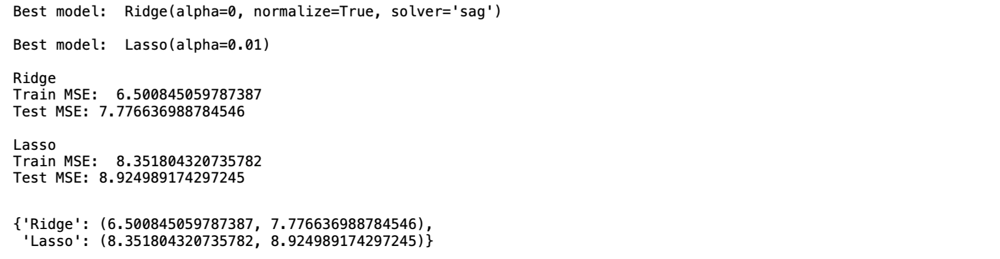

We repeat the exercise with `GridSearchCV`, and find models with slightly lower train and test MSE. We do note, however, that there appears to be potential overfitting occuring: With slighly (ridge) and no regularization (lasso), our models perform significantly better on our training set than our test set. We proceed with an attempt to identify areas for improvement in the heatmap below.

In [28]:
# Approx. 10 min runtime.
#best_gridCV, gridCVmodels = best_models(models, grids, searcher=GridSearchCV)
#best_gridCV, gridCVmodels

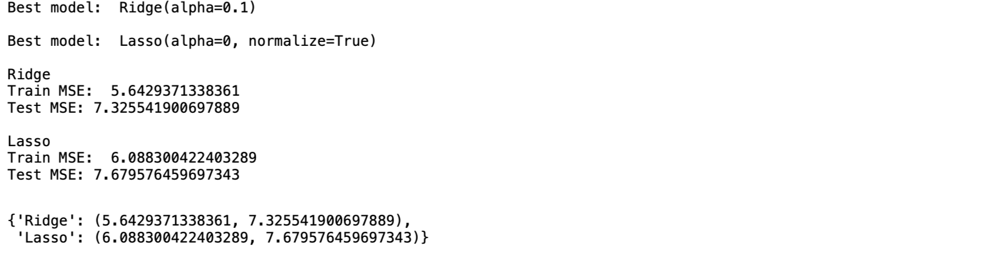

### Create Dict of HeatMaps from Tuned Ridge & Lasso Predictions

To avoid full map 'chaos' as the number of tuned models increase, we build a simple framework of feeding in the best model instances into the `pred_model_maps` function. It returns a dictionary of a train and test map for each of the models.

In [30]:
# Keep local copy of SearchCV MSEs results to avoid long runtime.
best_randCV_mses = {'Ridge': (5.6429371338361, 7.325541900697889),
 'Lasso': (6.088300422403289, 7.679576459697343)}

# Keep local copy of SearchCV results to avoid long runtime.
best_randCV_models_copy = {'Ridge': Ridge(alpha=0.01, solver='svd'),
 'Lasso': Lasso(alpha=0)}

In [31]:
""" Given tuned models, returns dict of each models train and test pred. error map. """
def best_pred_maps(_CVmodels):
    
    # Populate model dict with train and test placeholders.
    maps = {}
    for model in _CVmodels.keys():
        maps[model] = {'Train': None, 'Test': None}
    
    # Feed prediction maps into dict
    for model in _CVmodels.keys():
        trm, tsm = pred_err_plot(df, X_train, y_train, X_test, y_test, _CVmodels.get(model))
        maps[model]['Train'] = trm
        maps[model]['Test'] = tsm
    return maps

In [32]:
maps = best_pred_maps(best_randCV_models_copy)

Please note that we present the different maps below, but seek to analyze the drivers of prediction errors under the separate analysis-section.

In [33]:
maps['Ridge']['Test']

In [34]:
maps['Lasso']['Test']

Note: This same process can be repeated for the best models from `RandomSearchCV` as well, but is not included for brevity.

## Ensemble and Non-Linear Models

We proceed with applying the framework defined above on a series of more complex, yet promising models. For justification of the chosen model, see list below:

- `DecisionTreeRegressor()`, we use this single decision tree regressor as a reference point for the ensemble version, `RandomForestRegressor()`. We ask, how well does a single regression tree perform compared to a 2000 times larger one (this is the result of `RandomSearchCV` below)?


- `RandomForestRegressor()`, for several reasons. We wanted to experiment with a model that does not make any explicity assumptions of the structure of the data. At the same time, we sought a model that could deal with high dimensionality and large degree of multicolinearity across features. For more details, please refer to this [blog post.](https://datascience.stackexchange.com/questions/54751/when-to-use-random-forest)


- `SVR()`, a support vector regressor. Again, a model that has the ability to deal with well with high dimensional data. As an extra experiment, we also sought to find out whether or not it would prefer a polynomial kernel (in contrast to a linear one). Having performed the t-SNE dimensionality reducing algorithm and found that our data was linearily separable in some instances (SF vs. OAK) but not in all cases (across multiple cities), we were surprised to see the linear kernel being the optimal choice.


- `MLPRegressor`, a multi-layered perceptron regressor. What one of the team members (Peter) found to be most promising at first. It works like a simple neural network, using back-progagation to adjust hidden layer weights to minimize the MSE. Why did Peter place his bets on this one? With given the size of the feature space and the unknown relationship between it and our target variable, he was hoping to see some 'secret' (read: hidden) pattern that a NN might pick up on. Where humans are limited to only a subset of the bands from the satellite, Peter was hoping to see a model 'see' through that and perform well. Although performing well, we hope to see future improvements from NNs in future iterations of this project.

### Deploying models without hyperparameter tuning

Again, create a simple dict of model instances.

In [35]:
ex_models = {'DTR': DecisionTreeRegressor(),
          'RFR': RandomForestRegressor(),
         'SVR': SVR(),
         'MLPR': MLPRegressor()}

In [36]:
results(ex_models)

DTR
Train MSE:  0.28994629089248053
Test MSE: 12.529823166755675 

RFR
Train MSE:  1.055123089712166
Test MSE: 6.4774266398826486 

SVR
Train MSE:  9.920127132839298
Test MSE: 10.048400347882714 

MLPR
Train MSE:  4.352249499655797
Test MSE: 6.429633625774586 



{'DTR': (0.28994629089248053, 12.529823166755675),
 'RFR': (1.055123089712166, 6.4774266398826486),
 'SVR': (9.920127132839298, 10.048400347882714),
 'MLPR': (4.352249499655797, 6.429633625774586)}

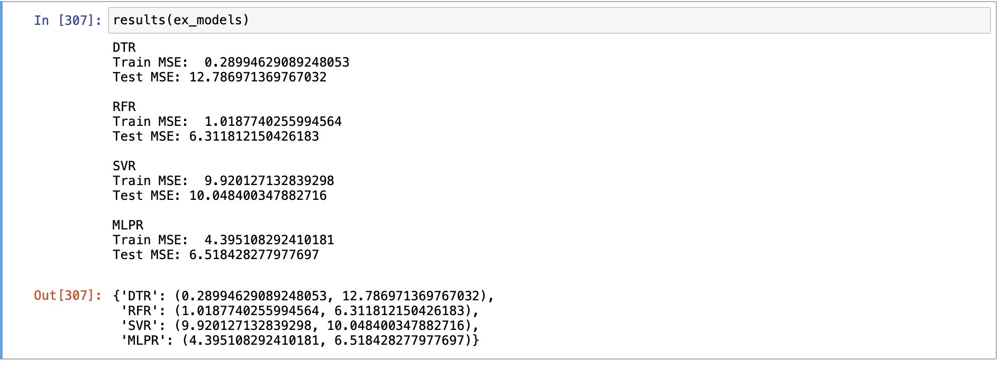

### Tuning More Complex Models' Hyperparameters

We now proceed with a larger task at hand: Defining the respective grids of the models. We take advantage of other people's work when it comes to defining the majority of these, but would like to highlight that several parameters  (e.g MLPR's hidden layers) have been fitted especially for this structure of data. 

In future iterations, we hope to explore even 'deeper' into a more specificed range of hyperparameters, but as the runtime of RandomSearchCV and GridSearchCV were 5 and 24 hrs, respectively, we chose the set below.

Examples of HPs worth further considerations: n_estimators in RFR, hidden_layer_sizes in MLPR, and a range of activation functions for the NN (SoftMax among others.)

Hyperparameter grid sources:
- [Decision Tree Regressor](https://www.nbshare.io/notebook/312837011/Decision-Tree-Regression-With-Hyper-Parameter-Tuning-In-Python/)
- [Random Forest Regressor](https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74)
- [Support Vector Regressor](https://stats.stackexchange.com/questions/269053/how-to-select-hyperparameters-for-svm-regression-after-grid-search)
- [Multi-Layer Perceptron Regressor](https://michael-fuchs-python.netlify.app/2021/02/10/nn-multi-layer-perceptron-regressor-mlpregressor/#hyper-parameter-tuning)

In [37]:
ex_grids = {'DTR' : {"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90]},
         
         'RFR' : {'bootstrap': [True, False],
             'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
             'max_features': ['auto', 'sqrt'],
             'min_samples_leaf': [1, 2, 4],
             'min_samples_split': [2, 5, 10],
             'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]},
         
         'SVR': {'kernel': ['linear', 'rbf','poly'],
                 'C':[1.5, 10],
                 'gamma': [1e-7, 1e-4],
                 'epsilon':[0.1,0.2,0.3,0.4,0.5]},
         'MLPR': {
            'hidden_layer_sizes': [(150,100,50), (120,80,40), (100,50,30)],
            'max_iter': [50, 100],
            'activation': ['tanh', 'relu'],
            'solver': ['sgd', 'adam'],
            'alpha': [0.0001, 0.05],
            'learning_rate': ['constant','adaptive']}
        }

In [38]:
# Takes approx. 5 hrs to run.
#best_randCVex, randCVexmodels = best_models(ex_models, ex_grids)

### Result of Random and GridSearchCV

We would like to specify that the models returned here have been trained on 5-fold cross validated data. They are then deployed on the whole training and test dataset, and those are the results you see below.

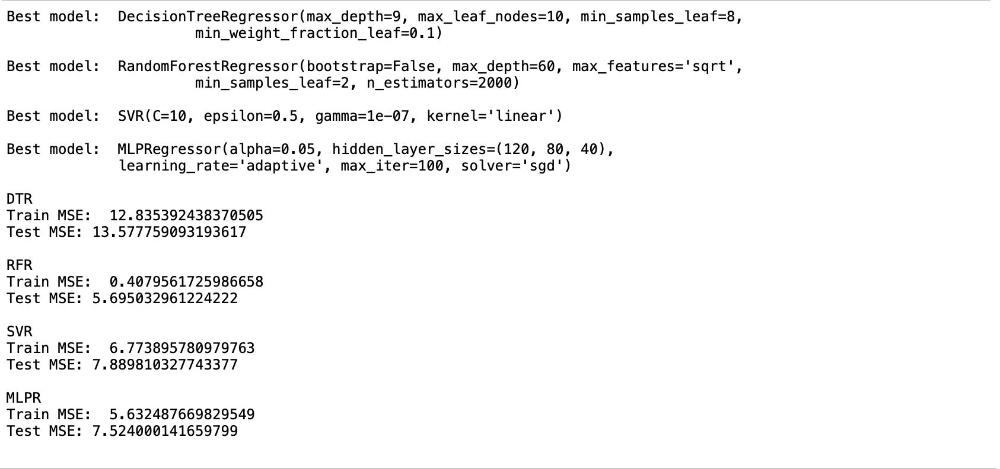

In [39]:
# Keep local copy of SearchCV MSEs results to avoid long runtime.

best_ex_model_mses = {
     'DTR': (12.835392438370505, 13.577759093193617),
     'RFR': (0.4079561725986658, 5.695032961224222),
     'SVR': (6.773895780979763, 7.889810327743377),
     'MLPR': (5.632487669829549, 7.524000141659799)}

# Keep local copy of SearchCV results to avoid long runtime.
best_ex_models_copy = {
    
    'DTR': DecisionTreeRegressor(max_depth=9, max_leaf_nodes=10, min_samples_leaf=8,
                       min_weight_fraction_leaf=0.1),
    
    'RFR': RandomForestRegressor(bootstrap=False, max_depth=60, max_features='sqrt',
                       min_samples_leaf=2, n_estimators=2000),
    
    'SVR': SVR(C=10, epsilon=0.5, gamma=1e-07, kernel='linear'),
    
    'MLPR': MLPRegressor(alpha=0.05, hidden_layer_sizes=(120, 80, 40),
              learning_rate='adaptive', max_iter=100, solver='sgd')}

### Plotting the Prediction Heatmap for Tuned Complex Models

Again, we are able to plot our best model's outcomes below. Feel free to adjust the dict keys to plot a new map!

In [40]:
c_maps = best_pred_maps(best_ex_models_copy)

In [41]:
c_maps['RFR']['Test']

In [42]:
# Takes too long to run - cancelled after 18 hrs. 
#best_gridCVex, gridCVexmodels = best_models(ex_models, ex_grids, GridSearchCV)

## Building a Stacked Ensemble

In this final part, we 'stack' all the tuned models from above into Sklearn's [StackingRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.StackingRegressor.html), with the goal of lowering final prediction errors. Below is an overview of the stacking process:



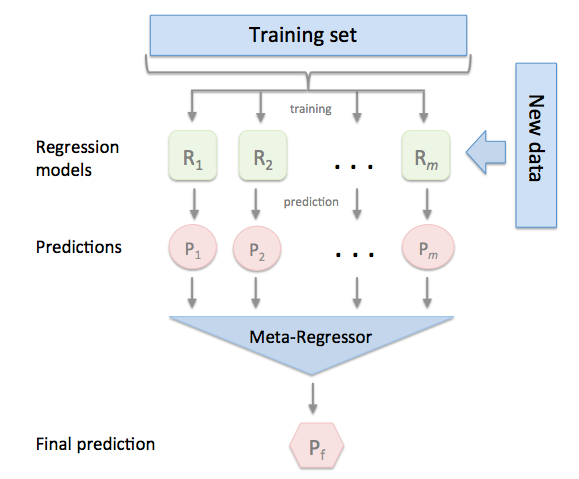

What happens in the stacking regressor is as follows actually quite cool: It trains all models under 5-fold cross validation, and then generate a matrix of those predictions for each single model. We now have a matrix of all predictions from a set of models. From here, a meta-regressor is applied: Using the model *predictions* as features, the final model generates a final prediction for a given observations. This process is repeated for the test set, but without cross-validation.

Note that our meta-regressor in this case is a `RandomForestRegressor(n_estimators=10)` trained on the predictions of each and single of the pre-tuned models. We chose the RFR as a meta-regressor based on its relatively short computation time and ability to deal with a large feature space, but future iterations (with more time and computing power) would like to perform a gridsearch on a series of potential choices.

Source: http://rasbt.github.io/mlxtend/user_guide/regressor/StackingRegressor/

In [43]:
# Add all pre-tuned models instances togheter into shared dict.
best_randCV_models_copy.update(best_ex_models_copy)
estimators_grid = list(best_randCV_models_copy.items())
estimators_grid

[('Ridge', Ridge(alpha=0.01, solver='svd')),
 ('Lasso', Lasso(alpha=0)),
 ('DTR',
  DecisionTreeRegressor(max_depth=9, max_leaf_nodes=10, min_samples_leaf=8,
                        min_weight_fraction_leaf=0.1)),
 ('RFR',
  RandomForestRegressor(bootstrap=False, max_depth=60, max_features='sqrt',
                        min_samples_leaf=2, n_estimators=2000)),
 ('SVR', SVR(C=10, epsilon=0.5, gamma=1e-07, kernel='linear')),
 ('MLPR',
  MLPRegressor(alpha=0.05, hidden_layer_sizes=(120, 80, 40),
               learning_rate='adaptive', max_iter=100, solver='sgd'))]

In [44]:
reg = StackingRegressor(
     estimators = estimators_grid,
     final_estimator = RandomForestRegressor(n_estimators=10,
                                        random_state=42))

In [ ]:
reg.fit(X_train, y_train)
pred_stacking = reg.predict(X_test)
mse_stacking = mean_squared_error(y_test, pred)

In [ ]:
train_mse, test_mse = run_model(X_train, X_test, y_train, y_test, reg)
print('Train MSE: ',train_mse)
print('Test MSE:', test_mse)

In [ ]:
val_pred = reg.predict(X_val)
val_mse = mean_squared_error(y_val, val_pred)
print('Val MSE:', val_mse)

In [ ]:
train_map, test_map = pred_err_plot(df, X_train, y_train, X_test, y_test, reg)

In [ ]:
___, val_map = pred_err_plot(df, X_train, y_train, X_val, y_val, reg)

In [ ]:
train_map

In [ ]:
test_map

In [ ]:
val_map

## Interpretation and Conclusions

#### Resource-Allocation Relevant Modelling

In this section you must relate your modeling and forecasting results to your original prediction question.  You must:
1. Address a resource allocation question.  What do the answers mean? What advice would you give a decision maker on the basis of your results?  How might they allocate their resources differently with the results of your model?  Why should the reader care about your results?

Our goal for this project was to attempt accurately predicting block-level median $NO_2$ concentration levels using satellite data of land features from sentinel-1 and sentinel-2. 

The resource allocation question we were trying to address is the placement of $NO_2$ sensors for city and state governments trying to monitor air quality. 

As stated at the beginning of this project, $NO_2$ sensors can cost roughly $400 per sensor so it is critical that local agencies are strategic with their placement in order to properly monitor the most polluted regions.

Cities that don’t have existing pollutant sensors but have access to the satellite data would ideally be able to predict the block-level median $NO_2$ concentration levels by using a model similar to the one we have developed.

Our goal, based on the results of our model, would be to help cities decide how to allocate sensors to areas that are predicted to have a high $NO_2$ concentration to ensure they stay within compliance of air pollution standards. 

One way could be observing areas where the model underperforms over extended periods of time. Could these, for instance, be areas where sensors are needed the most? This is only one of several potential outcomes from a successful model deployment. These results are important because they can help local government agencies figure out the most effective ways to manage air pollution, improving the health of the overall population.

#### Identifying Areas of Potential Model Improvement

2. Discuss caveats and / or reasons your results might be flawed.  No model is perfect, and understanding a model's imperfections is extremely important for the purpose of knowing how to interpret your results.  Often, we know the model output is wrong but we can assign a direction for its bias.  This helps to understand whether or not your answers are conservative.

Like any model, this one is far from perfect! To assess the errors with our model for this section of our project, we chose to focus our attention on observable patterns in our final (`StackingRegressor()`) model’s predictions on the test set. 

Below, you can see a series of maps that we produced from our data. The first map we looked at was the difference between the target value and the predicted value. The second map we looked at was the percent difference between the target value and predicted value.

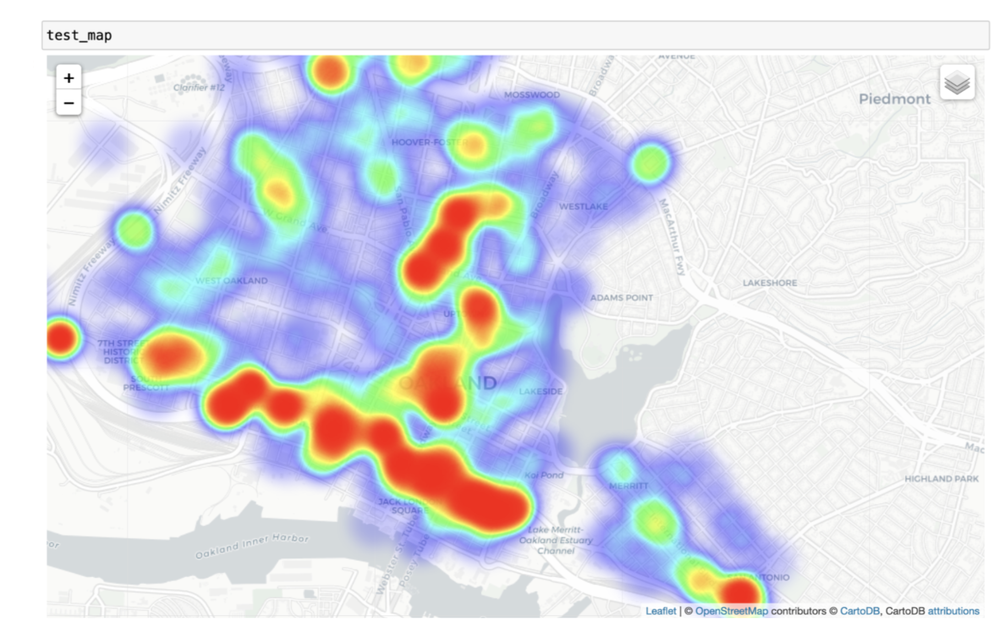

*Figure 1: Heat map of the difference between test target and test predicted values.*

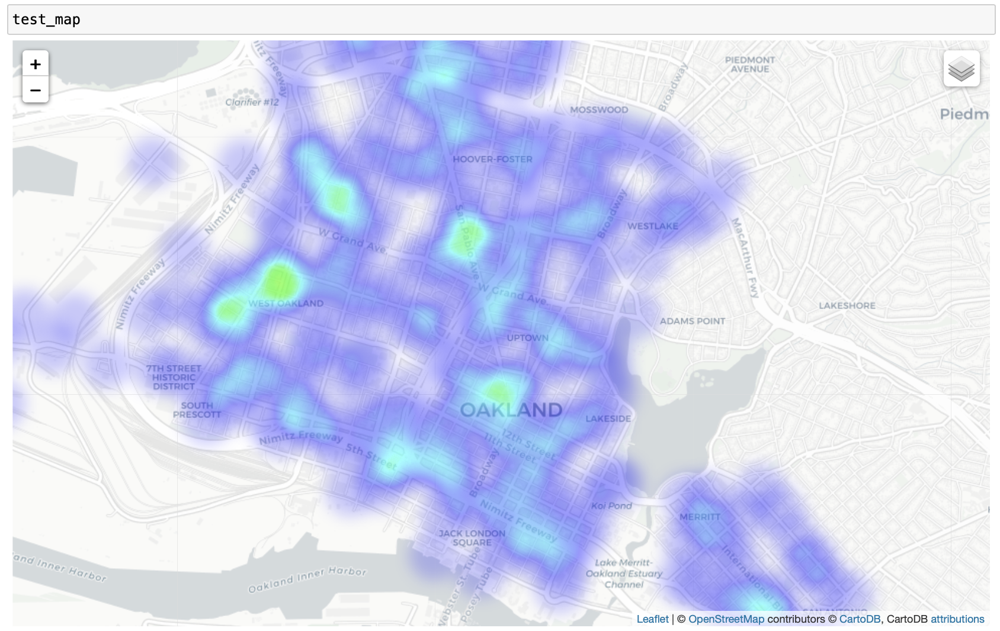

*Figure 2: Heat map of the percent difference between test target and test predicted values.*

####  Prediction Errors from Urban vs. Rural Areas

Based on our sample data, it seems that our model tends to *underestimate* the pollution levels near very busy areas such as highways and downtown areas and tends to *overestimate* in neighborhoods and less populated areas.

One possible explanation for this pattern in over- and under estimates could be that the light and land characteristics for neighborhoods and downtown areas could be similar in urban areas (such as downtown Oakland, shown in the image below) due to common material usage (cement, steel, glass) and repetitive shapes (squares, rectangles, triangles).

#### Prediction Errors from Natural vs. Industrial Land Characteristics
Another reason for this pattern of error in our data could be that the satellite land characteristic data has a stronger emphasis on differentiating natural land variations. The data differentiates between water, trees, grass, flooded vegetation, crops, shrub, scrub, bare, snow, ice, and built. 

While it has ten different categorizations for natural land characteristics, there is only one characteristic for man-made infrastructure which is the category “built”. This stronger emphasis on classifying natural landscapes could be the reason why our model had such a difficult time predicting pollution concentrations in variations of urban areas.

#### Prediction Errors from Temporality Overlap

Another reason that our results could be flawed could be due to the temporality of the different datasets.

We can't pinpoint the exact temporality of our embeddings data and are thus not fully certain if it matches up to our Google Street View Car sensor data that was taken over a 32 month period from May 2015 through December 2017.

#### Prediction Errors Induced from Geospatial Join
Another possible flaw could be due to overlapping plots of data from the satellite, which we didn’t think would impact our predictions and would be computationally taxing to account for in the long run. We created a heatmap of predicted areas that are being over predicted which gave us a better understanding of how well the model was performing in certain areas. Having only analyzed a subset of our model predictions, there's still much work to be done!

#### Conclusion

While our model did have some consistent errors, our model was decently accurate at predicting block-level median $NO_2$ concentration. Please refer to the prediction section of this project for numerical values.

Although a promising step towards a robust predictor of local $NO_2$ pollution, we are careful to suggest that this framework is ready to be generalisable across a series of environmental and geospatial prediction tasks.

#### Future Research Suggestions
Future iterations of this project should consider making it generalizable and robust across other pollutants before committing to a wider set of predictors. The Google Street View Car could be a useful starting point, as it contains 4 other pollutants that could be easily experimented with should one see that fit.

#### Authors: 
- Melikay Tshimanga (Data Science),
- Alessia K. Levante (Energy Engineering & EECS)
- Peter Flo Grinde-Hollevik (Data Science & EEP)